In [ ]:
from google.colab import drive
drive.mount('/content/drive')

BASE = "/content/drive/MyDrive/treering_project"  # change if you prefer
import os

dirs = [
    f"{BASE}/data/treering_400x400",     # put your 1000 images here (PNG)
    f"{BASE}/results/shift7",            # 7-pixel shift outputs
    f"{BASE}/results/phase_noise",       # FFT phase perturbation outputs
    f"{BASE}/figs",                      # side-by-side visualizations
    f"{BASE}/metrics"                    # CSVs with PSNR/SSIM
]
for d in dirs:
    os.makedirs(d, exist_ok=True)

print("Folders ready.")


Mounted at /content/drive
Folders ready.


# New Section

In [ ]:
!pip install numpy opencv-python scikit-image tqdm

# **Phase 1 — Data sanity checks (400×400)**

Goal: verify every image is 400×400 RGB, convert if needed.

In [ ]:
import cv2, glob, os
from tqdm import tqdm

DATA = f"{BASE}/data/treering_400x400"
bad = []

for p in tqdm(sorted(glob.glob(f"{DATA}/*.png"))):
    im = cv2.imread(p, cv2.IMREAD_UNCHANGED)
    if im is None:
        bad.append((p, "unreadable"))
        continue
    if len(im.shape) == 2:  # grayscale
        im = cv2.cvtColor(im, cv2.COLOR_GRAY2RGB)
        cv2.imwrite(p, cv2.cvtColor(im, cv2.COLOR_RGB2BGR))
    elif im.shape[2] == 4:  # RGBA -> RGB
        im = cv2.cvtColor(im, cv2.COLOR_BGRA2BGR)

    h, w = im.shape[:2]
    if (h, w) != (400, 400):
        im = cv2.resize(im, (400, 400), interpolation=cv2.INTER_AREA)
        cv2.imwrite(p, im)

print("Done. Problem files:", bad[:5])


100%|██████████| 1000/1000 [00:41<00:00, 23.83it/s]

Done. Problem files: []


# **Phase 2 — Baseline TreeRing removal: 7-pixel horizontal shift + edge restoration**

Goal: implement the simple, effective method that disrupts TreeRing signals.

Core functions:

In [ ]:
import numpy as np
import cv2

def shift_horizontal(img_rgb, shift=7):
    # np.roll wraps pixels around, keeps size
    return np.roll(img_rgb, shift=shift, axis=1)

def restore_left_edge(original_rgb, shifted_rgb, shift=7):
    out = shifted_rgb.copy()
    out[:, :shift, :] = original_rgb[:, :shift, :]
    return out


Batch run on all 1000 images

In [ ]:
from tqdm import tqdm
import glob, os

DATA = f"{BASE}/data/treering_400x400"
OUT = f"{BASE}/results/shift7"
paths = sorted(glob.glob(f"{DATA}/*.png"))

for p in tqdm(paths):
    img_bgr = cv2.imread(p)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    shifted = shift_horizontal(img_rgb, shift=7)
    final = restore_left_edge(img_rgb, shifted, shift=7)

    out_path = os.path.join(OUT, os.path.basename(p))
    cv2.imwrite(out_path, cv2.cvtColor(final, cv2.COLOR_RGB2BGR))


100%|██████████| 1000/1000 [01:05<00:00, 15.23it/s]


# **Phase 3 — Alternative method: small Fourier phase perturbation (optional)**

Goal: have a second method for comparison and ablation.

FFT-based phase tweak

In [ ]:
import numpy as np
import cv2

def fft_phase_perturb(img_rgb, sigma=0.03, seed=123):
    # Work in luminance-like single channel to reduce color shifts
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    np.random.seed(seed)

    F = np.fft.fft2(img_gray)
    Fshift = np.fft.fftshift(F)
    mag = np.abs(Fshift)
    phase = np.angle(Fshift)

    noise = np.random.normal(0, sigma, phase.shape)
    phase_new = phase + noise

    F_new = mag * np.exp(1j * phase_new)
    F_ishift = np.fft.ifftshift(F_new)
    recon = np.fft.ifft2(F_ishift)
    recon = np.clip(np.abs(recon), 0, 1)

    # Put luminance back onto original colors using simple ratio
    # Avoid strong color drift by gentle blending
    gray_orig = img_gray + 1e-6
    scale = (recon / gray_orig)
    scale = np.clip(scale, 0.7, 1.3)   # conservative clamp
    out = img_rgb.astype(np.float32) / 255.0
    for c in range(3):
        out[:,:,c] = np.clip(out[:,:,c] * scale, 0, 1)

    out = (out * 255.0 + 0.5).astype(np.uint8)
    return out


Batch run

In [ ]:
OUT2 = f"{BASE}/results/phase_noise"
paths = sorted(glob.glob(f"{DATA}/*.png"))

for p in tqdm(paths):
    img_bgr = cv2.imread(p)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    out = fft_phase_perturb(img_rgb, sigma=0.03, seed=123)
    cv2.imwrite(os.path.join(OUT2, os.path.basename(p)),
                cv2.cvtColor(out, cv2.COLOR_RGB2BGR))


100%|██████████| 1000/1000 [01:56<00:00,  8.58it/s]


# **Phase 4 — Quality restoration pass (optional but recommended)**

Goal: fix tiny color or contrast drifts while not reintroducing marks.

CIELAB luminance match (watermark-safe)

In [ ]:
import numpy as np
import cv2

def lab_luminance_match(src_rgb, ref_rgb):
    # src_rgb: processed image, ref_rgb: original image
    src_lab = cv2.cvtColor(src_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)
    ref_lab = cv2.cvtColor(ref_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)

    Ls, a_s, b_s = cv2.split(src_lab)
    Lr, a_r, b_r = cv2.split(ref_lab)

    # Match L-channel statistics
    mu_s, std_s = np.mean(Ls), np.std(Ls) + 1e-6
    mu_r, std_r = np.mean(Lr), np.std(Lr) + 1e-6
    Ls_adj = ((Ls - mu_s) * (std_r / std_s)) + mu_r

    out_lab = cv2.merge([Ls_adj, a_s, b_s])
    out_rgb = cv2.cvtColor(out_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)
    return out_rgb


Apply CIELAB luminance match to both methods

In [ ]:
# Phase 4.2 — Apply CIELAB luminance match to both methods

import os, glob, cv2
import numpy as np
from tqdm import tqdm

BASE = BASE  # assumes BASE was defined earlier, e.g., "/content/drive/MyDrive/treering_project"

REF_DIR = f"{BASE}/data/treering_400x400"
IN_DIRS = {
    "shift7": f"{BASE}/results/shift7",
    "phase_noise": f"{BASE}/results/phase_noise",
}
OUT_DIRS = {
    "shift7_restored": f"{BASE}/results/shift7_restored",
    "phase_noise_restored": f"{BASE}/results/phase_noise_restored",
}

# Create output folders
for d in OUT_DIRS.values():
    os.makedirs(d, exist_ok=True)

def lab_luminance_match(src_rgb, ref_rgb):
    """Match L-channel statistics (CIELAB) of src to ref, keep a/b from src to avoid reintroducing marks."""
    # Convert to LAB (uint8 range expected by OpenCV conversions)
    src_lab = cv2.cvtColor(src_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)
    ref_lab = cv2.cvtColor(ref_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)

    Ls, a_s, b_s = cv2.split(src_lab)
    Lr, _, _     = cv2.split(ref_lab)

    mu_s, std_s = float(Ls.mean()), float(Ls.std() + 1e-6)
    mu_r, std_r = float(Lr.mean()), float(Lr.std() + 1e-6)

    # Match luminance stats
    Ls_adj = ((Ls - mu_s) * (std_r / std_s)) + mu_r
    Ls_adj = np.clip(Ls_adj, 0, 255)

    out_lab = cv2.merge([Ls_adj, a_s, b_s]).astype(np.uint8)
    out_rgb = cv2.cvtColor(out_lab, cv2.COLOR_LAB2RGB)
    return out_rgb

def restore_folder(ref_dir, in_dir, out_dir, overwrite=False):
    paths = sorted(glob.glob(os.path.join(in_dir, "*.png")))
    print(f"Restoring luminance for {len(paths)} images from\n  {in_dir}\n→ {out_dir}")
    for p in tqdm(paths):
        name = os.path.basename(p)
        ref_p = os.path.join(ref_dir, name)
        out_p = os.path.join(out_dir, name)

        if (not overwrite) and os.path.exists(out_p):
            continue

        # Read images
        ref_bgr = cv2.imread(ref_p)
        src_bgr = cv2.imread(p)
        if ref_bgr is None or src_bgr is None:
            # Skip unreadable images
            continue

        ref_rgb = cv2.cvtColor(ref_bgr, cv2.COLOR_BGR2RGB)
        src_rgb = cv2.cvtColor(src_bgr, cv2.COLOR_BGR2RGB)

        out_rgb = lab_luminance_match(src_rgb, ref_rgb)
        out_bgr = cv2.cvtColor(out_rgb, cv2.COLOR_RGB2BGR)
        cv2.imwrite(out_p, out_bgr)

# Run for both methods
restore_folder(REF_DIR, IN_DIRS["shift7"],       OUT_DIRS["shift7_restored"],       overwrite=False)
restore_folder(REF_DIR, IN_DIRS["phase_noise"],  OUT_DIRS["phase_noise_restored"],  overwrite=False)

print("Done: shift7_restored and phase_noise_restored created.")


Restoring luminance for 1000 images from
  /content/drive/MyDrive/treering_project/results/shift7
→ /content/drive/MyDrive/treering_project/results/shift7_restored


100%|██████████| 1000/1000 [01:29<00:00, 11.20it/s]


Restoring luminance for 1000 images from
  /content/drive/MyDrive/treering_project/results/phase_noise
→ /content/drive/MyDrive/treering_project/results/phase_noise_restored


100%|██████████| 1000/1000 [01:27<00:00, 11.38it/s]

Done: shift7_restored and phase_noise_restored created.


# **Phase 5 — Evaluation: PSNR, SSIM, and quick galleries**

Goal: quantify quality and prepare visuals for report.

Compute metrics

In [ ]:
import pandas as pd
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import glob, os, cv2

def evaluate_folder(ref_dir, test_dir, out_csv):
    rows = []
    refs = sorted(glob.glob(f"{ref_dir}/*.png"))
    for rp in tqdm(refs):
        name = os.path.basename(rp)
        tp = os.path.join(test_dir, name)
        if not os.path.exists(tp): continue

        r = cv2.imread(rp)
        t = cv2.imread(tp)
        r = cv2.cvtColor(r, cv2.COLOR_BGR2RGB)
        t = cv2.cvtColor(t, cv2.COLOR_BGR2RGB)

        r_g = cv2.cvtColor(r, cv2.COLOR_RGB2GRAY)
        t_g = cv2.cvtColor(t, cv2.COLOR_RGB2GRAY)

        ps = psnr(r_g, t_g, data_range=255)
        ss = ssim(r_g, t_g, data_range=255)

        rows.append({"image": name, "psnr": ps, "ssim": ss})

    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    return df

ref_dir = f"{BASE}/data/treering_400x400"
df_shift = evaluate_folder(ref_dir, f"{BASE}/results/shift7", f"{BASE}/metrics/shift7.csv")
df_phase = evaluate_folder(ref_dir, f"{BASE}/results/phase_noise", f"{BASE}/metrics/phase_noise.csv")

df_shift.describe(), df_phase.describe()


100%|██████████| 1000/1000 [00:59<00:00, 16.73it/s]


(              psnr         ssim
 count  1000.000000  1000.000000
 mean     18.500698     0.567642
 std       3.153603     0.137955
 min       8.740855     0.082521
 25%      16.341304     0.479833
 50%      18.206134     0.581223
 75%      20.537629     0.668711
 max      31.166525     0.905550,
               psnr         ssim
 count  1000.000000  1000.000000
 mean     45.749954     0.997085
 std       2.318112     0.001244
 min      39.270640     0.987151
 25%      44.109497     0.996588
 50%      45.543092     0.997358
 75%      47.236245     0.997906
 max      54.115506     0.998995)

Visual grids for the report

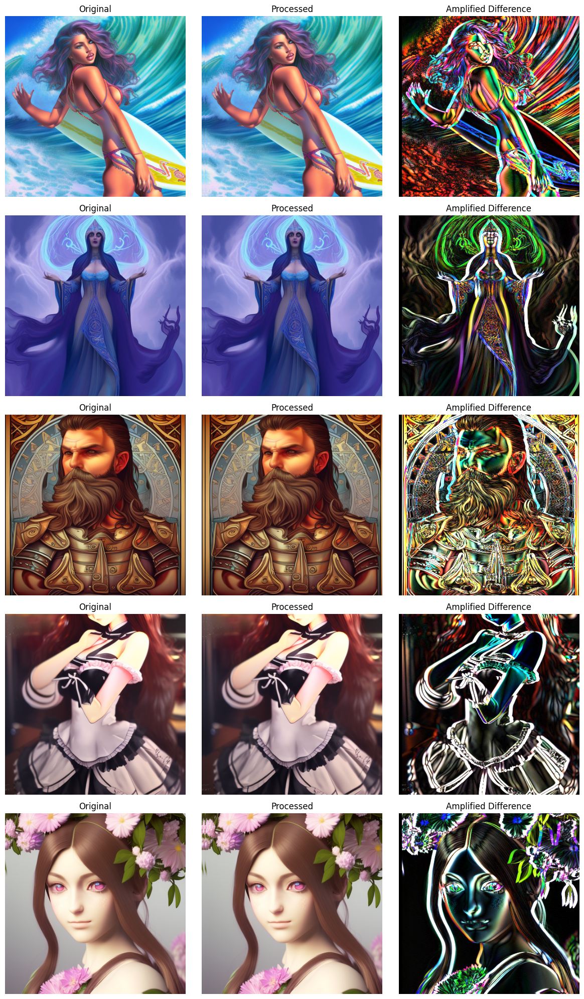

Saved → /content/drive/MyDrive/treering_project/figs/shift7_vs_orig.png


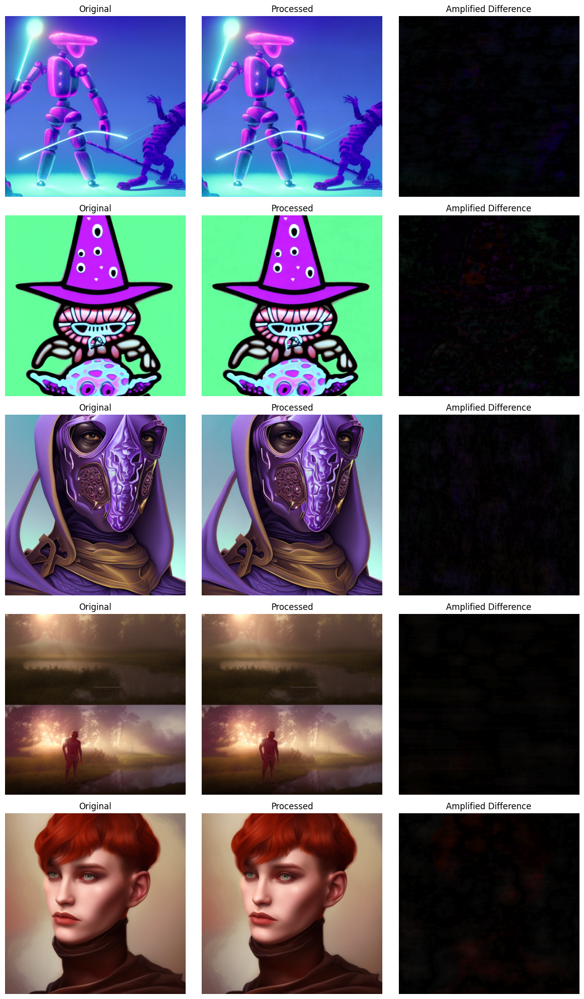

Saved → /content/drive/MyDrive/treering_project/figs/phase_vs_orig.png


In [ ]:
# --- Part 5.2 (updated) — Visual grids for arbitrary filenames ---

import os, glob, random
from pathlib import Path
import numpy as np
import cv2
import matplotlib.pyplot as plt

# === CONFIG ===
# Ensure BASE is defined earlier (e.g., "/content/drive/MyDrive/treering_project")
ref_dir     = f"{BASE}/data/treering_400x400"
method_dirs = {
    "shift7":       f"{BASE}/results/shift7",
    "phase_noise":  f"{BASE}/results/phase_noise",
    # You can add restored versions too if needed
    # "shift7_restored": f"{BASE}/results/shift7_restored",
    # "phase_noise_restored": f"{BASE}/results/phase_noise_restored",
}
figs_dir = f"{BASE}/figs"
os.makedirs(figs_dir, exist_ok=True)

# === Helper functions ===
def list_pngs(folder):
    """Return set of all .png and .PNG filenames in a folder."""
    p = Path(folder)
    return set([f.name for f in p.glob("*.png")] + [f.name for f in p.glob("*.PNG")])

def load_rgb(path):
    """Load image as RGB, return None if file missing."""
    bgr = cv2.imread(path)
    if bgr is None:
        return None
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def show_triplets_intersection(ref_dir, method_dir, out_path, k=5, amplify=4):
    """Show grids of (original, processed, amplified diff) for random images."""
    # 1) Find filenames present in both ref_dir and method_dir
    ref_names    = list_pngs(ref_dir)
    method_names = list_pngs(method_dir)
    common = sorted(list(ref_names & method_names))
    if len(common) == 0:
        raise FileNotFoundError(
            f"No common .png files between:\n  {ref_dir}\n  {method_dir}\n"
            "Check that your output basenames match the originals."
        )

    # Randomly sample k filenames from the intersection
    pick = common if len(common) <= k else random.sample(common, k)

    cols, rows = 3, len(pick)
    plt.figure(figsize=(12, 4 * rows))

    used = 0
    for i, name in enumerate(pick):
        ref_path  = os.path.join(ref_dir, name)
        test_path = os.path.join(method_dir, name)

        ref = load_rgb(ref_path)
        tst = load_rgb(test_path)
        if ref is None or tst is None:
            print(f"[warn] Skipping {name} (couldn't read).")
            continue

        # amplified difference visualization
        diff = np.clip(np.abs(ref.astype(np.int16) - tst.astype(np.int16)) * amplify, 0, 255).astype(np.uint8)

        for j, im in enumerate([ref, tst, diff]):
            ax = plt.subplot(rows, cols, used * cols + j + 1)
            ax.imshow(im)
            ax.set_title(["Original", "Processed", "Amplified Difference"][j])
            ax.axis('off')
        used += 1

    if used == 0:
        raise RuntimeError("All sampled images failed to load.")
    plt.tight_layout()
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved → {out_path}")

# === Run for both methods ===
show_triplets_intersection(ref_dir, method_dirs["shift7"],      f"{figs_dir}/shift7_vs_orig.png",      k=5)
show_triplets_intersection(ref_dir, method_dirs["phase_noise"], f"{figs_dir}/phase_vs_orig.png",       k=5)


Original | Shift7 | PhaseNoise | Diff(Shift7−Orig) | Diff(Phase−Orig)

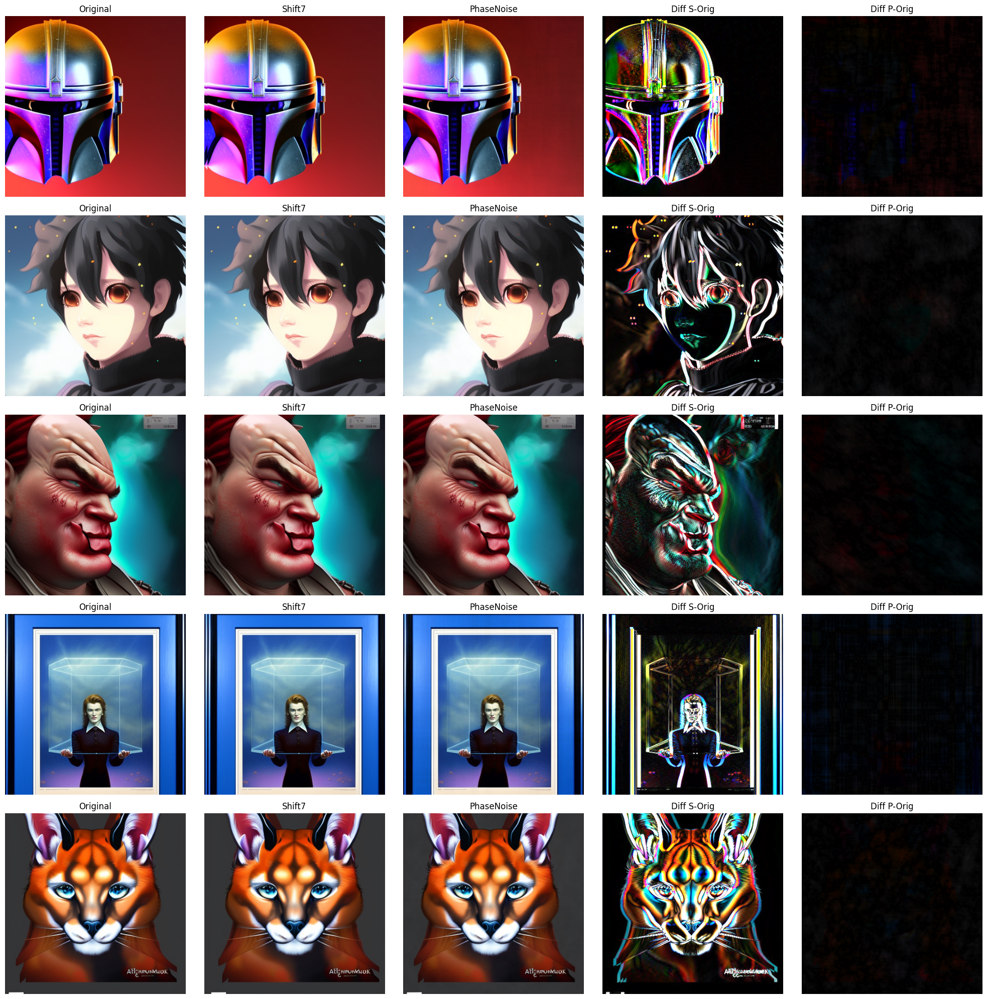

Saved → /content/drive/MyDrive/treering_project/figs/combined_shift7_vs_phase.png


In [ ]:
# Combined grid: Original | Shift7 | PhaseNoise | Diff(Shift7-Orig) | Diff(Phase-Orig)

import os, random
from pathlib import Path
import numpy as np
import cv2
import matplotlib.pyplot as plt

# --- CONFIG ---
# Ensure BASE is already defined (e.g., "/content/drive/MyDrive/treering_project")
ref_dir       = f"{BASE}/data/treering_400x400"
shift_dir     = f"{BASE}/results/shift7"
phase_dir     = f"{BASE}/results/phase_noise"
figs_dir      = f"{BASE}/figs"
os.makedirs(figs_dir, exist_ok=True)
out_path      = f"{figs_dir}/combined_shift7_vs_phase.png"

# --- Helpers ---
def list_pngs(folder):
    p = Path(folder)
    return set([f.name for f in p.glob("*.png")] + [f.name for f in p.glob("*.PNG")])

def load_rgb(path):
    bgr = cv2.imread(path)
    if bgr is None:
        return None
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def show_combined_grid(ref_dir, shift_dir, phase_dir, out_path, k=5, amplify=4):
    # Find common filenames across all three folders
    names_ref   = list_pngs(ref_dir)
    names_shift = list_pngs(shift_dir)
    names_phase = list_pngs(phase_dir)
    common = sorted(list(names_ref & names_shift & names_phase))
    if not common:
        raise FileNotFoundError(
            f"No common .png files across:\n  {ref_dir}\n  {shift_dir}\n  {phase_dir}\n"
            "Check that outputs kept the same basenames as inputs."
        )

    pick = common if len(common) <= k else random.sample(common, k)

    cols = 5  # Orig, Shift7, Phase, Diff(Shift7-Orig), Diff(Phase-Orig)
    rows = len(pick)
    plt.figure(figsize=(4*cols, 4*rows))

    used = 0
    for name in pick:
        ref   = load_rgb(os.path.join(ref_dir,   name))
        shft  = load_rgb(os.path.join(shift_dir, name))
        phas  = load_rgb(os.path.join(phase_dir, name))
        if ref is None or shft is None or phas is None:
            print(f"[warn] Skipping {name} (failed to read).")
            continue

        diff_shift = np.clip(np.abs(ref.astype(np.int16) - shft.astype(np.int16)) * amplify, 0, 255).astype(np.uint8)
        diff_phase = np.clip(np.abs(ref.astype(np.int16) - phas.astype(np.int16)) * amplify, 0, 255).astype(np.uint8)

        row_imgs = [ref, shft, phas, diff_shift, diff_phase]
        titles   = ["Original", "Shift7", "PhaseNoise", "Diff S-Orig", "Diff P-Orig"]

        for j, (im, title) in enumerate(zip(row_imgs, titles)):
            ax = plt.subplot(rows, cols, used*cols + j + 1)
            ax.imshow(im)
            ax.set_title(title)
            ax.axis('off')

        used += 1

    if used == 0:
        raise RuntimeError("All sampled images failed to load. Check paths and filenames.")

    plt.tight_layout()
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved → {out_path}")

# Run it
show_combined_grid(ref_dir, shift_dir, phase_dir, out_path, k=5, amplify=4)
